# Question 2

Identify Areas Most Affected by the Top Complaint Type





# Imports + Options

In [9]:
# Normal data analysis packages 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Mapping imports 
import folium
import folium.plugins as plugins 

In [10]:
pd.options.display.max_rows = 200
pd.options.display.max_columns = 40

sns.set_style('whitegrid')

# Data

## Data Import 


In [11]:
df311_heat = pd.read_pickle('df311_heat.pkl')

In [12]:
df311_heat.head()

,Unique Key,Created Date,Closed Date,Number of Heat Complaints,Location Type,Incident Zip,Incident Address,Street Name,Address Type,City,Status,Resolution Description,Borough,Latitude,Longitude,Created DateTime,Year,Month
0,45531130,02/02/2020 06:09:17 AM,NaN,HEAT/HOT WATER,RESIDENTIAL BUILDING,10019.0,426 WEST 52 STREET,WEST 52 STREET,ADDRESS,NEW YORK,Open,The following complaint conditions are still o...,MANHATTAN,40.765132,-73.988993,2020-02-02 06:09:17,2020,2
2,45527528,02/02/2020 02:27:41 AM,NaN,HEAT/HOT WATER,RESIDENTIAL BUILDING,11372.0,87-15 37 AVENUE,37 AVENUE,ADDRESS,Jackson Heights,Open,The following complaint conditions are still o...,QUEENS,40.750269,-73.879432,2020-02-02 02:27:41,2020,2
3,45530329,02/02/2020 12:13:18 PM,NaN,HEAT/HOT WATER,RESIDENTIAL BUILDING,10458.0,2405 SOUTHERN BOULEVARD,SOUTHERN BOULEVARD,ADDRESS,BRONX,Open,The following complaint conditions are still o...,BRONX,40.853773,-73.881558,2020-02-02 12:13:18,2020,2
5,45530344,02/02/2020 07:52:08 AM,NaN,HEAT/HOT WATER,RESIDENTIAL BUILDING,10456.0,1131 MORRIS AVENUE,MORRIS AVENUE,ADDRESS,BRONX,Open,The following complaint conditions are still o...,BRONX,40.831381,-73.915218,2020-02-02 07:52:08,2020,2
7,45527939,02/02/2020 09:00:54 AM,NaN,HEAT/HOT WATER,RESIDENTIAL BUILDING,11372.0,37-20 81 STREET,81 STREET,ADDRESS,Jackson Heights,Open,The following complaint conditions are still o...,QUEENS,40.749320,-73.885190,2020-02-02 09:00:54,2020,2


In [13]:
df311_heat.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2149424 entries, 0 to 6019841
Data columns (total 18 columns):
 #   Column                     Non-Null Count    Dtype         
---  ------                     --------------    -----         
 0   Unique Key                 2149424 non-null  int64         
 1   Created Date               2149424 non-null  object        
 2   Closed Date                2133429 non-null  object        
 3   Number of Heat Complaints  2149424 non-null  object        
 4   Location Type              2149424 non-null  object        
 5   Incident Zip               2130400 non-null  float64       
 6   Incident Address           2149423 non-null  object        
 7   Street Name                2149423 non-null  object        
 8   Address Type               2131428 non-null  object        
 9   City                       2130543 non-null  object        
 10  Status                     2149424 non-null  object        
 11  Resolution Description     2149200 no

## Data Cleaning

In [14]:
# Creating a list of lat/long for plotting. Removing nan's and duplicates 
locations = df311_heat[['Latitude', 'Longitude']].dropna().drop_duplicates().values.tolist()

# Creating of a borough dataframe for plotting
df311_heat_borough = df311_heat.groupby(['Borough'], as_index=True).count()['Unique Key'].to_frame('Number of Heat Complaints').reset_index()
df311_heat_borough = df311_heat_borough[df311_heat_borough['Borough']!='Unspecified']
df311_heat_borough['Borough'] = df311_heat_borough['Borough'].str.title()

# EDA

,Borough,Number of Heat Complaints
0,Bronx,606133
1,Brooklyn,574845
2,Manhattan,423039
3,Queens,244122
4,Staten Island,18368


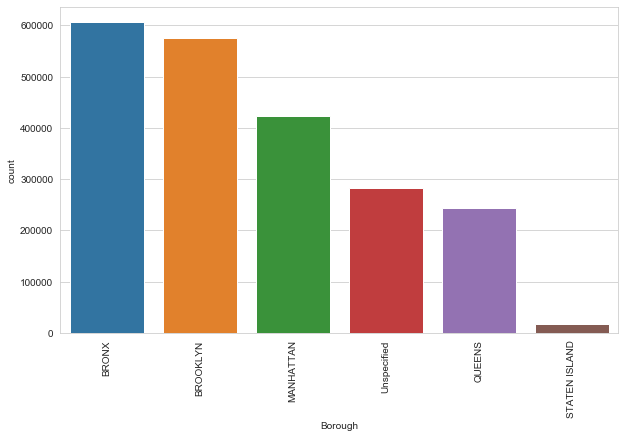

In [15]:
plt.figure(figsize=(10,6))
sns.countplot('Borough', data=df311_heat, order = df311_heat['Borough'].value_counts().index)

plt.xticks(rotation=90)

df311_heat_borough

In [24]:
df311_heat.groupby('Street Name').count()['Unique Key'].sort_values(ascending=False).nlargest(5)

Street Name
GRAND CONCOURSE    37863
BROADWAY           24484
OCEAN AVENUE       18716
MORRIS AVENUE      16409
ARDEN STREET       15963
Name: Unique Key, dtype: int64

In [25]:
df311_heat.groupby('Incident Zip').count()['Unique Key'].sort_values(ascending=False).nlargest(5)

Incident Zip
11226.0    69041
10467.0    66073
10458.0    65372
10468.0    58190
10453.0    57818
Name: Unique Key, dtype: int64

In [27]:
# definition of the boundaries in the map
borough_geo = r'Borough Boundaries.geojson'
  
map = folium.Map(location=[40.699305, -73.921027], tiles='cartodbpositron', zoom_start=11)

folium.Choropleth(
    geo_data=borough_geo,
    data=df311_heat_borough,
    columns=['Borough', 'Number of Heat Complaints'],
    key_on='feature.properties.boro_name',
    fill_color='Reds',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of Heat Complaints'
).add_to(map)

plugins.FastMarkerCluster(locations).add_to(map)

map

# Conclusions

The greatest number of heating complaints:
- Borough: Bronx
- Street: Grand Concourse
- ZIP: 69041